## Import libraries


In [2]:
## 筛选两次数据
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import warnings
import sklearn
import scipy as sp
import statsmodels as sm
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
import torch as t
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.utils.data as data
import torchvision as tv
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models
import torchvision.utils as vutils
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import auc 
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.metrics import log_loss
from sklearn.metrics import brier_score_loss
import umap

## Read csvs

In [4]:
# Data are sorted in ./task1
Train_DataX = pd.read_csv("./SuperData/X_train.csv", index_col=[0], header=[0, 1, 2])
Valid_DataX = pd.read_csv("./SuperData/X_valid.csv", index_col=[0], header=[0, 1, 2])
Test_DataX = pd.read_csv('./SuperData/X_test.csv', header=[0,1,2], index_col=0)
Train_DataY = pd.read_csv("./task1/Y_train.csv", index_col=[0], header=[0])
Valid_DataY = pd.read_csv("./task1/Y_valid.csv", index_col=[0], header=[0])
Train_task2_Y = pd.read_csv("./task2/Y_train.csv", index_col=[0], header=[0])

Train_DataX.fillna(0, inplace=True)
Valid_DataX.fillna(0, inplace=True)
Test_DataX.fillna(0, inplace=True)

## Get traindata

In [ ]:
# For each header[0], with header[1] == 'mean' and header[2] == 'avg' get the data as a new DataFrame with header == header[0]
Train_mean_avg = Train_DataX.loc[:, (slice(None), 'mean', 'avg')]
Train_mean_avg.columns = Train_mean_avg.columns.droplevel([1, 2])
Train_mean_avg.head()

LEVEL2,alanine aminotransferase,albumin,albumin ascites,albumin pleural,albumin urine,alkaline phosphate,anion gap,asparate aminotransferase,basophils,bicarbonate,...,tidal volume set,tidal volume spontaneous,total protein,total protein urine,troponin-i,troponin-t,venous pvo2,weight,white blood cell count,white blood cell count urine
3_145834_211552,-0.254460,-1.979855,0.0,0.0,0.0,-0.318615,0.931458,-0.226618,0.000000,-1.694872,...,0.440628,0.000000,0.0,0.0,0.0,0.000000,0.0,1.026004,0.634186,0.160067
6_107064_228232,-0.256599,-0.251806,0.0,0.0,0.0,-0.422405,1.723627,-0.254291,-0.742403,-1.444821,...,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,-0.181589,0.000000
9_150750_220597,-0.269432,0.000000,0.0,0.0,0.0,-0.367050,-0.330641,-0.271686,2.097036,1.019964,...,1.039571,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,-0.181589,0.000000
11_194540_229441,0.000000,0.000000,0.0,0.0,0.0,0.000000,-0.088963,0.000000,0.000000,0.484141,...,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.0,0.000000,-0.139623,0.000000
12_112213_232669,0.000000,0.000000,0.0,0.0,0.0,0.000000,1.240269,0.000000,0.000000,-1.694872,...,0.680205,-1.333059,0.0,0.0,0.0,-0.317391,0.0,0.000000,-0.414731,0.000000


In [ ]:
# For each header[0], with header[1] == 'mean' and header[2] == 'diff' get the data as a new DataFrame with header == header[0]
Train_mean_diff = Train_DataX.loc[:, (slice(None), 'mean', 'diff')]
Train_mean_diff.columns = Train_mean_diff.columns.droplevel([1, 2])
Train_mean_diff.head()

LEVEL2,alanine aminotransferase,albumin,albumin ascites,albumin pleural,albumin urine,alkaline phosphate,anion gap,asparate aminotransferase,basophils,bicarbonate,...,tidal volume set,tidal volume spontaneous,total protein,total protein urine,troponin-i,troponin-t,venous pvo2,weight,white blood cell count,white blood cell count urine
3_145834_211552,0.0,0.0,0.0,0.0,0.0,0.0,1.369512,0.0,0.0,0.857316,...,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.891268,0.0
6_107064_228232,0.0,0.0,0.0,0.0,0.0,0.0,0.725036,0.0,0.0,0.642987,...,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0
9_150750_220597,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.857316,...,0.83852,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.578192,0.0
11_194540_229441,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.214329,...,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.326399,0.0
12_112213_232669,0.0,0.0,0.0,0.0,0.0,0.0,4.108536,0.0,0.0,3.214937,...,1.67704,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.055954,0.0


In [ ]:
# For each header[0], with header[1] == 'mask' and header[2] == 'sum' get the data as a new DataFrame with header == header[0]
Train_mask_sum = Train_DataX.loc[:, (slice(None), 'mask', 'sum')]
Train_mask_sum.columns = Train_mask_sum.columns.droplevel([1, 2])
Train_mask_sum.head()

LEVEL2,alanine aminotransferase,albumin,albumin ascites,albumin pleural,albumin urine,alkaline phosphate,anion gap,asparate aminotransferase,basophils,bicarbonate,...,tidal volume set,tidal volume spontaneous,total protein,total protein urine,troponin-i,troponin-t,venous pvo2,weight,white blood cell count,white blood cell count urine
3_145834_211552,1.0,1.0,0.0,0.0,0.0,1.0,3.0,1.0,0.0,4.0,...,7.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0
6_107064_228232,1.0,1.0,0.0,0.0,0.0,1.0,2.0,1.0,1.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0
9_150750_220597,1.0,0.0,0.0,0.0,0.0,1.0,2.0,1.0,1.0,2.0,...,7.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0
11_194540_229441,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,2.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0
12_112213_232669,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,3.0,...,7.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0


In [ ]:
# For each header[0], with header[1] == 'time_since_measured' and header[2] == 'diff' get the data as a new DataFrame with header == header[0]
Train_time_since_measured_diff = Train_DataX.loc[:, (slice(None), 'time_since_measured', 'diff')]
Train_time_since_measured_diff.columns = Train_time_since_measured_diff.columns.droplevel([1, 2])
Train_time_since_measured_diff.head()

LEVEL2,alanine aminotransferase,albumin,albumin ascites,albumin pleural,albumin urine,alkaline phosphate,anion gap,asparate aminotransferase,basophils,bicarbonate,...,tidal volume set,tidal volume spontaneous,total protein,total protein urine,troponin-i,troponin-t,venous pvo2,weight,white blood cell count,white blood cell count urine
3_145834_211552,23.0,23.0,0.0,0.0,0.0,23.0,9.0,23.0,0.0,9.0,...,4.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,15.0,100.0
6_107064_228232,23.0,23.0,0.0,0.0,0.0,23.0,19.0,23.0,23.0,19.0,...,23.0,0.0,0.0,0.0,0.0,0.0,0.0,23.0,19.0,23.0
9_150750_220597,43.0,23.0,0.0,0.0,0.0,43.0,12.0,43.0,23.0,12.0,...,5.0,0.0,0.0,0.0,0.0,0.0,0.0,23.0,12.0,23.0
11_194540_229441,23.0,23.0,0.0,0.0,0.0,23.0,19.0,23.0,23.0,19.0,...,23.0,0.0,0.0,0.0,0.0,0.0,0.0,23.0,19.0,23.0
12_112213_232669,23.0,23.0,0.0,0.0,0.0,23.0,16.0,23.0,23.0,16.0,...,31.0,100.0,0.0,0.0,0.0,23.0,0.0,23.0,16.0,23.0


## Get the valid data

In [ ]:
# For each header[0], with header[1] == 'mean' and header[2] == 'avg' get the data as a new DataFrame with header == header[0]
Valid_mean_avg = Valid_DataX.loc[:, (slice(None), 'mean', 'avg')]
Valid_mean_avg.columns = Valid_mean_avg.columns.droplevel([1, 2])
Valid_mean_avg.head()

LEVEL2,alanine aminotransferase,albumin,albumin ascites,albumin pleural,albumin urine,alkaline phosphate,anion gap,asparate aminotransferase,basophils,bicarbonate,...,tidal volume set,tidal volume spontaneous,total protein,total protein urine,troponin-i,troponin-t,venous pvo2,weight,white blood cell count,white blood cell count urine
4_185777_294638,-0.255529,-0.539814,0.0,0.0,0.0,4.967764,0.152716,-0.230571,-0.742403,-0.480340,...,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,-1.220127,-0.265520,0.000000
21_109451_217847,-0.149653,0.000000,0.0,0.0,0.0,-0.325534,2.650061,-0.064531,0.000000,-1.480542,...,0.000000,0.000000,0.0,0.0,0.0,0.973905,-0.794602,-0.705746,0.909515,0.000000
25_129635_203487,-0.256599,0.036202,0.0,0.0,0.0,-0.678421,-0.733439,-0.225827,-0.484272,0.055483,...,0.000000,0.000000,0.0,0.0,0.0,-0.039540,-0.854332,0.785960,-0.039372,0.000000
114_178393_258626,0.000000,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.591306,...,2.117668,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.854544,0.499185,-0.249199
129_164174_238431,-0.248043,-0.107802,0.0,0.0,0.0,-0.311696,-0.451481,-0.261407,-0.355206,0.376977,...,0.440628,0.457595,0.0,0.0,0.0,0.000000,0.000000,-0.431409,-0.158275,0.000000


In [ ]:
# For each header[0], with header[1] == 'mean' and header[2] == 'diff' get the data as a new DataFrame with header == header[0]
Valid_mean_diff = Valid_DataX.loc[:, (slice(None), 'mean', 'diff')]
Valid_mean_diff.columns = Valid_mean_diff.columns.droplevel([1, 2])
Valid_mean_diff.head()

LEVEL2,alanine aminotransferase,albumin,albumin ascites,albumin pleural,albumin urine,alkaline phosphate,anion gap,asparate aminotransferase,basophils,bicarbonate,...,tidal volume set,tidal volume spontaneous,total protein,total protein urine,troponin-i,troponin-t,venous pvo2,weight,white blood cell count,white blood cell count urine
4_185777_294638,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
21_109451_217847,0.000000,0.0,0.0,0.0,0.0,0.000000,0.966714,0.000000,0.000000,0.857316,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.223816,0.0
25_129635_203487,0.000000,0.0,0.0,0.0,0.0,0.000000,2.900143,0.000000,0.000000,0.428658,...,0.0,0.0,0.0,0.0,0.0,0.436369,0.0,0.0,0.130559,0.0
114_178393_258626,0.000000,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.0
129_164174_238431,0.010695,0.0,0.0,0.0,0.0,0.138387,0.241679,0.006325,0.258131,0.428658,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.233142,0.0


In [ ]:
# For each header[0], with header[1] == 'mask' and header[2] == 'sum' get the data as a new DataFrame with header == header[0]
Valid_mask_sum = Valid_DataX.loc[:, (slice(None), 'mask', 'sum')]
Valid_mask_sum.columns = Valid_mask_sum.columns.droplevel([1, 2])
Valid_mask_sum.head()

LEVEL2,alanine aminotransferase,albumin,albumin ascites,albumin pleural,albumin urine,alkaline phosphate,anion gap,asparate aminotransferase,basophils,bicarbonate,...,tidal volume set,tidal volume spontaneous,total protein,total protein urine,troponin-i,troponin-t,venous pvo2,weight,white blood cell count,white blood cell count urine
4_185777_294638,1.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
21_109451_217847,1.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,0.0,3.0,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,2.0,0.0
25_129635_203487,1.0,1.0,0.0,0.0,0.0,1.0,6.0,1.0,1.0,6.0,...,0.0,0.0,0.0,0.0,0.0,5.0,1.0,1.0,4.0,0.0
114_178393_258626,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0
129_164174_238431,2.0,1.0,0.0,0.0,0.0,2.0,2.0,2.0,2.0,2.0,...,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,2.0,0.0


In [ ]:
# For each header[0], with header[1] == 'time_since_measured' and header[2] == 'diff' get the data as a new DataFrame with header == header[0]
Valid_time_since_measured_diff = Valid_DataX.loc[:, (slice(None), 'time_since_measured', 'diff')]
Valid_time_since_measured_diff.columns = Valid_time_since_measured_diff.columns.droplevel([1, 2])
Valid_time_since_measured_diff.head()

LEVEL2,alanine aminotransferase,albumin,albumin ascites,albumin pleural,albumin urine,alkaline phosphate,anion gap,asparate aminotransferase,basophils,bicarbonate,...,tidal volume set,tidal volume spontaneous,total protein,total protein urine,troponin-i,troponin-t,venous pvo2,weight,white blood cell count,white blood cell count urine
4_185777_294638,100.0,100.0,0.0,0.0,0.0,100.0,100.0,100.0,100.0,100.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,100.0,0.0
21_109451_217847,25.0,23.0,0.0,0.0,0.0,25.0,19.0,25.0,23.0,19.0,...,0.0,0.0,0.0,0.0,0.0,23.0,100.0,23.0,25.0,0.0
25_129635_203487,36.0,55.0,0.0,0.0,0.0,36.0,7.0,36.0,23.0,7.0,...,0.0,0.0,0.0,0.0,0.0,7.0,15.0,24.0,17.0,0.0
114_178393_258626,23.0,23.0,0.0,0.0,0.0,23.0,23.0,23.0,23.0,15.0,...,100.0,0.0,0.0,0.0,0.0,23.0,23.0,35.0,15.0,100.0
129_164174_238431,15.0,50.0,0.0,0.0,0.0,15.0,15.0,15.0,15.0,15.0,...,24.0,100.0,0.0,0.0,0.0,23.0,23.0,23.0,15.0,23.0


## Define a function to get selected attribute

In [ ]:
# Define a function to get selected data column name with corelation to each other larger or smaller than a threshold
def get_corr(data, corr_threshold):
    data_corr = data.corr()
    for i in range(data_corr.shape[0]):
        data_corr.iloc[i, i] = 0
    for i in range(data_corr.shape[0]):
        for j in range(data_corr.shape[1]):
            if data_corr.iloc[i, j] > corr_threshold or data_corr.iloc[i, j] < -corr_threshold:
                data_corr.iloc[i, j] = 1
            else:
                data_corr.iloc[i, j] = 0
    data_corr = data_corr.astype(bool)
    data_corr = data_corr.any(axis=1)
    data_corr = data_corr[data_corr == True]
    data_corr = data_corr.index
    return data_corr

## Analysis train data feature relationship

In [ ]:
# Analysis train data

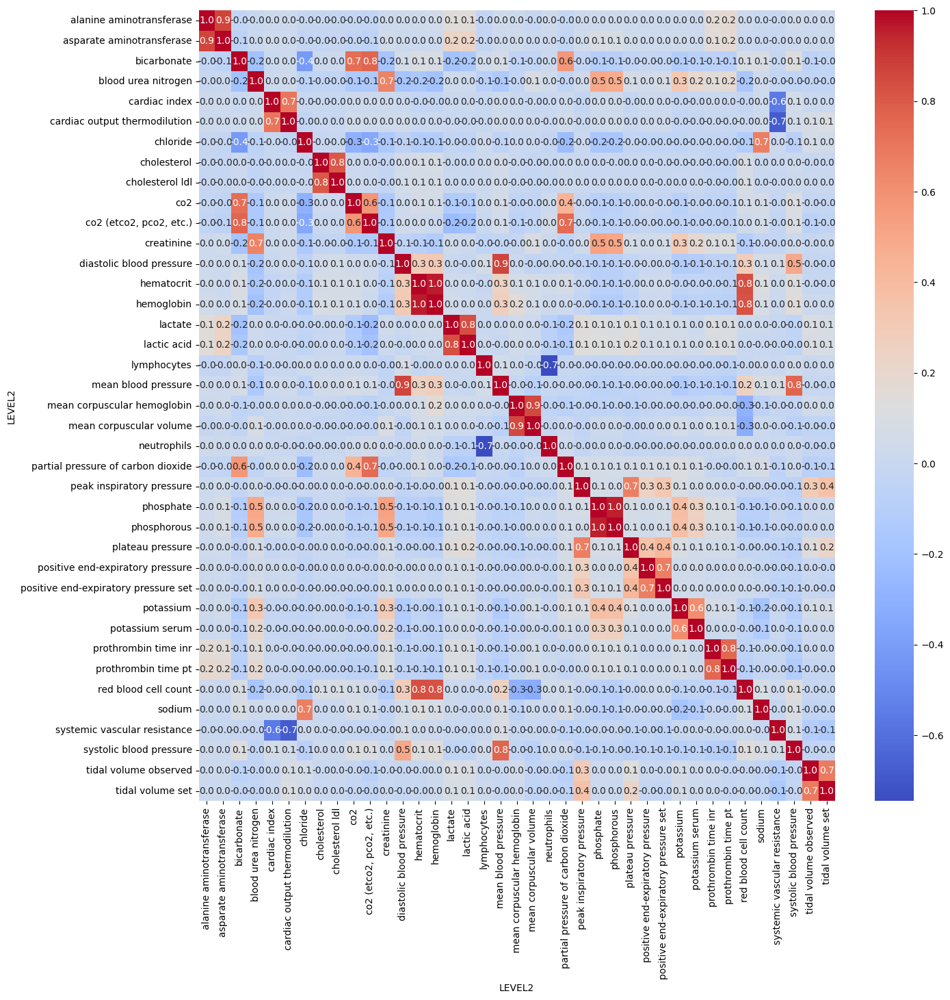

In [ ]:
# Plot correlation matrix of mean_avg with threshold 0.6
Train_mean_avg_attr = get_corr(Train_mean_avg, 0.6)
Train_mean_avg_corr = Train_mean_avg[Train_mean_avg_attr].corr()
plt.figure(figsize=(15, 15))
sns.heatmap(Train_mean_avg_corr, annot=True, fmt=".1f", cmap="coolwarm")
plt.show()

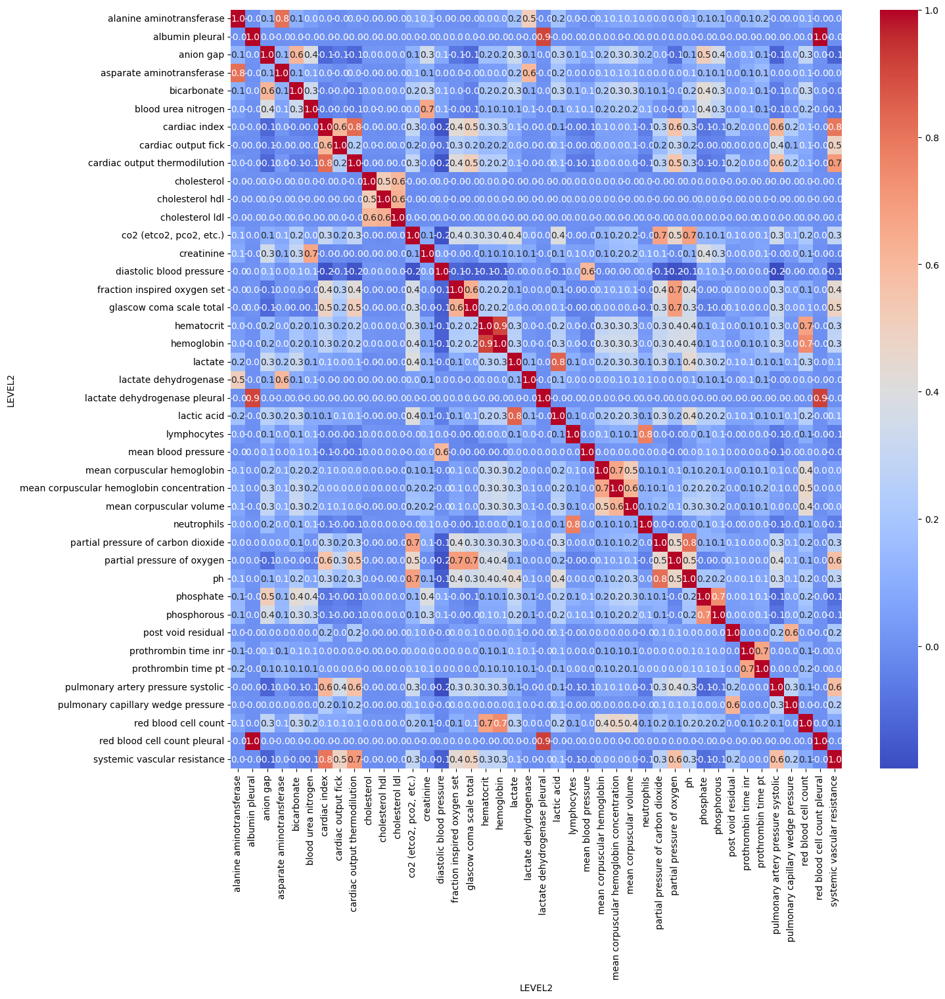

In [ ]:
# Plot correlation matrix of mean_diff with threshold 0.6
Train_mean_diff_attr = get_corr(Train_mean_diff, 0.6)
Train_mean_diff_corr = Train_mean_diff[Train_mean_diff_attr].corr()
plt.figure(figsize=(15, 15))
sns.heatmap(Train_mean_diff_corr, annot=True, fmt='.1f', cmap='coolwarm')
plt.show()

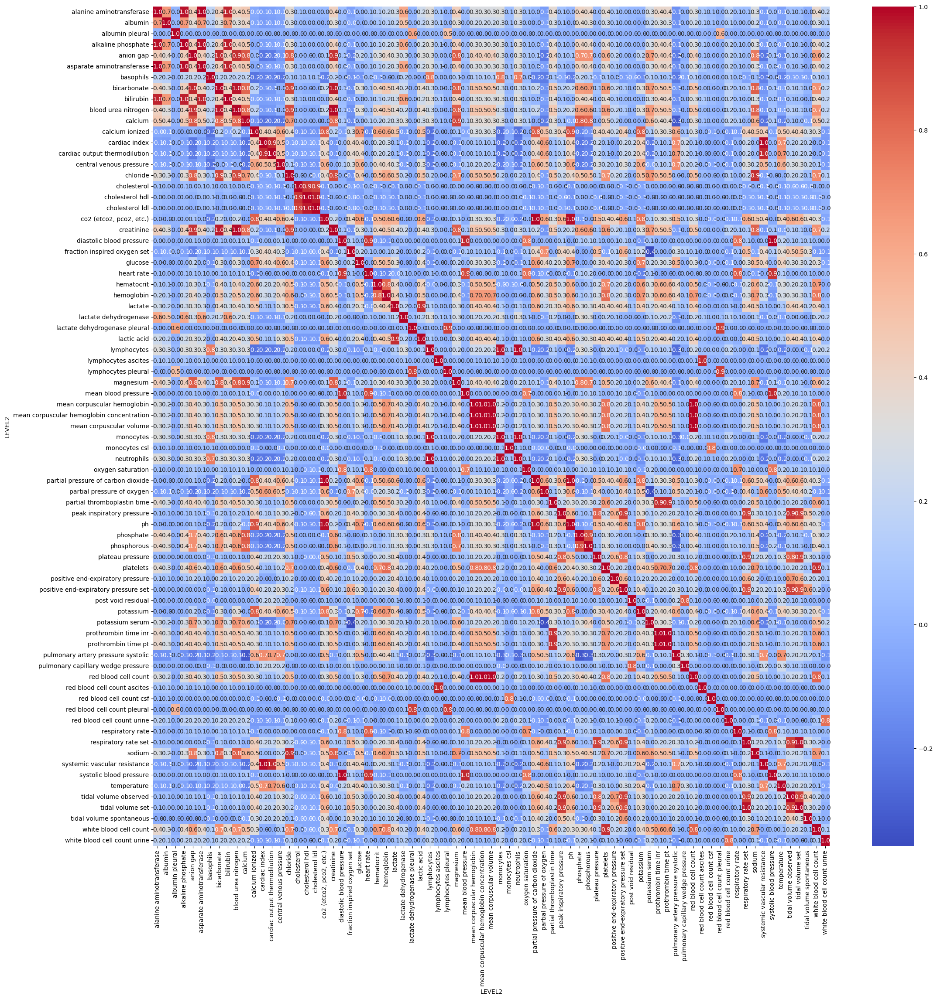

In [ ]:
# Plot correlation matrix of mask_sum with threshold 0.6
Train_mask_sum_attr = get_corr(Train_mask_sum, 0.6)
Train_mask_sum_corr = Train_mask_sum[Train_mask_sum_attr].corr()
plt.figure(figsize=(25, 25))
sns.heatmap(Train_mask_sum_corr, annot=True, fmt='.1f', cmap='coolwarm')
plt.show()

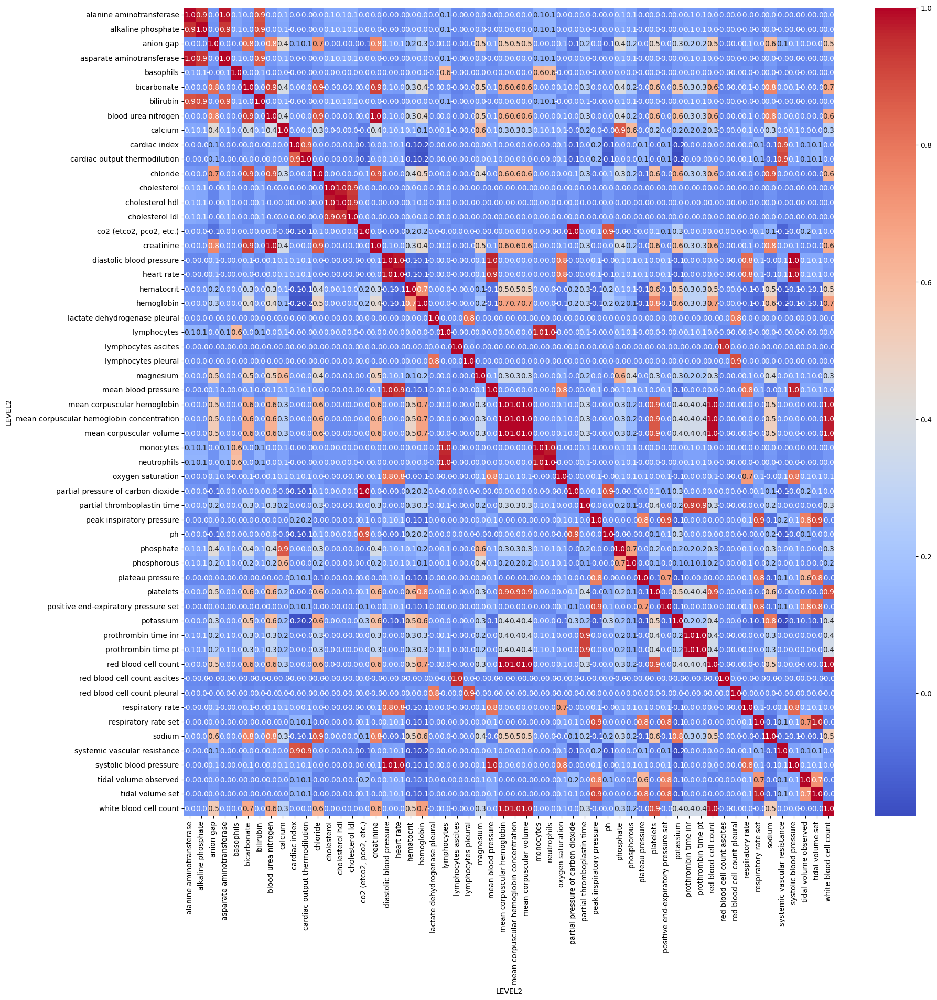

In [ ]:
# Plot correlation matrix of time_since_measured_diff with threshold 0.6
Train_time_since_measured_diff_attr = get_corr(Train_time_since_measured_diff, 0.6)
Train_time_since_measured_diff_corr = Train_time_since_measured_diff[Train_time_since_measured_diff_attr].corr()
plt.figure(figsize=(20, 20))
sns.heatmap(Train_time_since_measured_diff_corr, annot=True, fmt='.1f', cmap='coolwarm')
plt.show()

## Analysis train data feature relationship

In [ ]:
# Analysis valid data

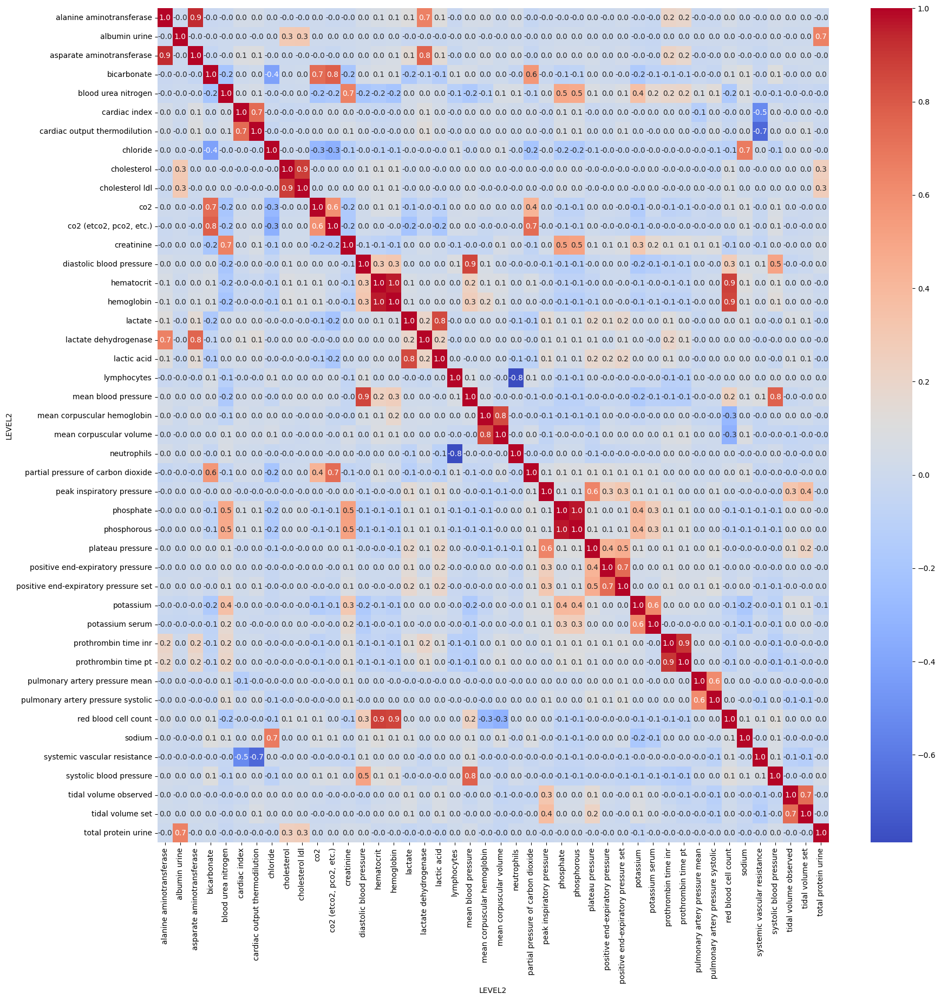

In [ ]:
# Plot correlation matrix of mean_avg with threshold 0.6
Valid_mean_avg_attr = get_corr(Valid_mean_avg, 0.6)
Valid_mean_avg_corr = Valid_mean_avg[Valid_mean_avg_attr].corr()
plt.figure(figsize=(20, 20))
sns.heatmap(Valid_mean_avg_corr, annot=True, fmt=".1f", cmap="coolwarm")
plt.show()

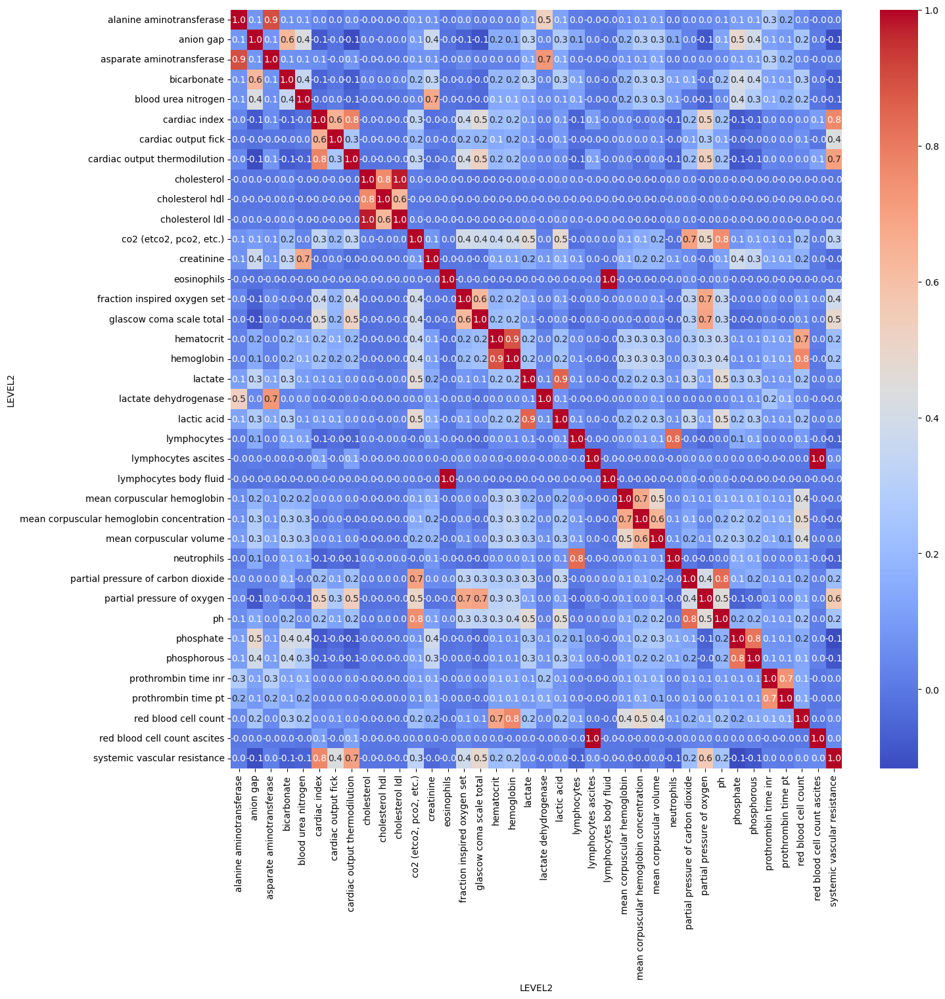

In [ ]:
# Plot correlation matrix of mean_diff with threshold 0.6
Valid_mean_diff_attr = get_corr(Valid_mean_diff, 0.6)
Valid_mean_diff_corr = Valid_mean_diff[Valid_mean_diff_attr].corr()
plt.figure(figsize=(15, 15))
sns.heatmap(Valid_mean_diff_corr, annot=True, fmt='.1f', cmap='coolwarm')
plt.show()

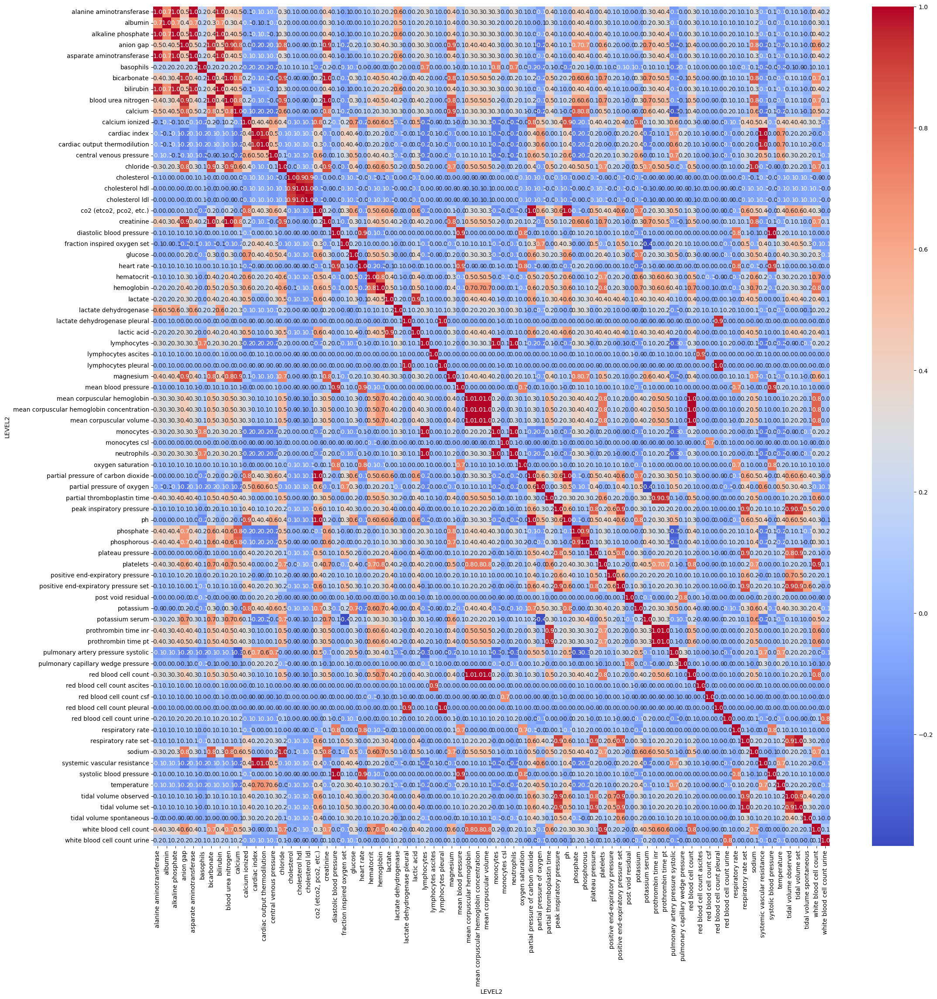

In [ ]:
# Plot correlation matrix of mask_sum with threshold 0.6
Valid_mask_sum_attr = get_corr(Valid_mask_sum, 0.6)
Valid_mask_sum_corr = Valid_mask_sum[Valid_mask_sum_attr].corr()
plt.figure(figsize=(25, 25))
sns.heatmap(Valid_mask_sum_corr, annot=True, fmt='.1f', cmap='coolwarm')
plt.show()

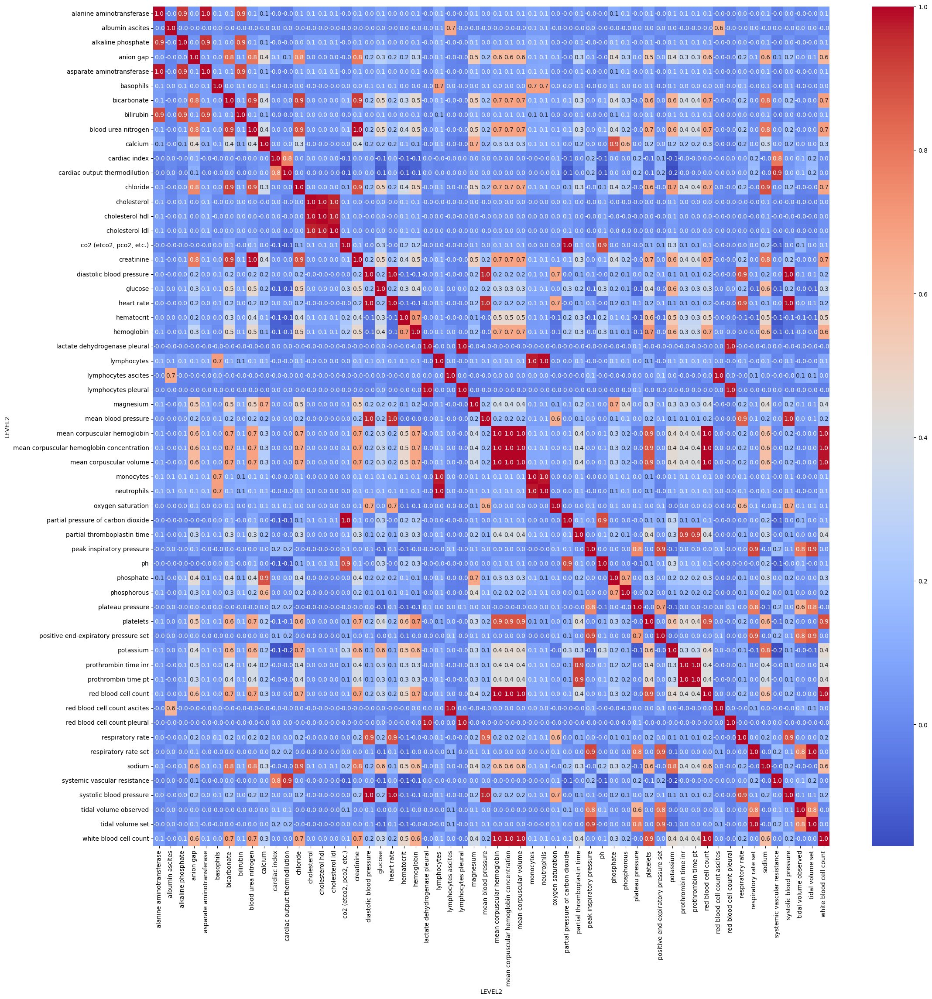

In [ ]:
# Plot correlation matrix of time_since_measured_diff with threshold 0.6
Valid_time_since_measured_diff_attr = get_corr(Valid_time_since_measured_diff, 0.6)
Valid_time_since_measured_diff_corr = Valid_time_since_measured_diff[Valid_time_since_measured_diff_attr].corr()
plt.figure(figsize=(25, 25))
sns.heatmap(Valid_time_since_measured_diff_corr, annot=True, fmt='.1f', cmap='coolwarm')
plt.show()

## Analysis the Overall Train data

In [ ]:
# Get the data with selected attributes
Train_whole = Train_DataX.loc[:, (slice(None), ['mean', 'mask', 'time_since_measured'], ['avg', 'sum', 'diff'])]

In [ ]:
# Classify the data into 2 groups: Y == 0 and Y == 1
Train_whole_0 = Train_whole[Train_DataY["mort_icu"] == 0]
Train_whole_1 = Train_whole[Train_DataY["mort_icu"] == 1]

In [ ]:
# Analysis similar records
# Using a umap to reduce the dimension of data to 2D
reducer = umap.UMAP(random_state=1024)
Train_whole_0_reduced = reducer.fit_transform(Train_whole_0)
Train_whole_1_reduced = reducer.fit_transform(Train_whole_1)

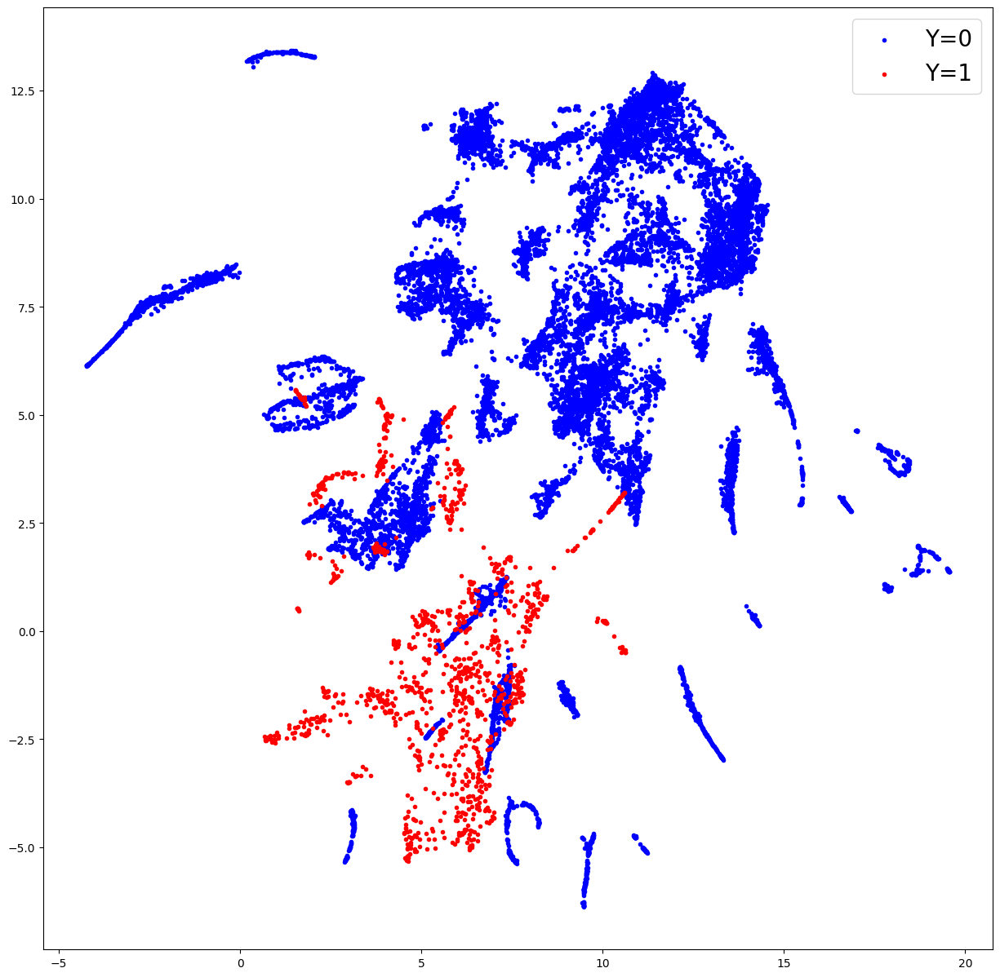

In [ ]:
# Plot the points in scatter plot
plt.figure(figsize=(15, 15))
plt.scatter(Train_whole_0_reduced[:, 0], Train_whole_0_reduced[:, 1], c='b', label='Y=0', marker='.')
plt.scatter(Train_whole_1_reduced[:, 0], Train_whole_1_reduced[:, 1], c='r', label='Y=1', marker='.')
plt.legend(fontsize=20)
plt.show()

In [ ]:
# Group the data by Y in task 2 into 9 groups: [1,2), [2,3), [3,4), [4,5), [5,6), [6,7), [7,8), [8,9), [9,10]

In [ ]:
# Grouping
Train_whole_2_1 = Train_whole[Train_task2_Y["los_icu"] < 2]
Train_whole_2_2 = Train_whole[(Train_task2_Y["los_icu"] >= 2) & (Train_task2_Y["los_icu"] < 3)]
Train_whole_2_3 = Train_whole[(Train_task2_Y["los_icu"] >= 3) & (Train_task2_Y["los_icu"] < 4)]
Train_whole_2_4 = Train_whole[(Train_task2_Y["los_icu"] >= 4) & (Train_task2_Y["los_icu"] < 5)]
Train_whole_2_5 = Train_whole[(Train_task2_Y["los_icu"] >= 5) & (Train_task2_Y["los_icu"] < 6)]
Train_whole_2_6 = Train_whole[(Train_task2_Y["los_icu"] >= 6) & (Train_task2_Y["los_icu"] < 7)]
Train_whole_2_7 = Train_whole[(Train_task2_Y["los_icu"] >= 7) & (Train_task2_Y["los_icu"] < 8)]
Train_whole_2_8 = Train_whole[(Train_task2_Y["los_icu"] >= 8) & (Train_task2_Y["los_icu"] < 9)]
Train_whole_2_9 = Train_whole[Train_task2_Y["los_icu"] >= 9]

In [ ]:
# Use umap to reduce the dimension of data to 2D
Train_whole_2_1_reduced = reducer.fit_transform(Train_whole_2_1)
Train_whole_2_2_reduced = reducer.fit_transform(Train_whole_2_2)
Train_whole_2_3_reduced = reducer.fit_transform(Train_whole_2_3)
Train_whole_2_4_reduced = reducer.fit_transform(Train_whole_2_4)
Train_whole_2_5_reduced = reducer.fit_transform(Train_whole_2_5)
Train_whole_2_6_reduced = reducer.fit_transform(Train_whole_2_6)
Train_whole_2_7_reduced = reducer.fit_transform(Train_whole_2_7)
Train_whole_2_8_reduced = reducer.fit_transform(Train_whole_2_8)
Train_whole_2_9_reduced = reducer.fit_transform(Train_whole_2_9)

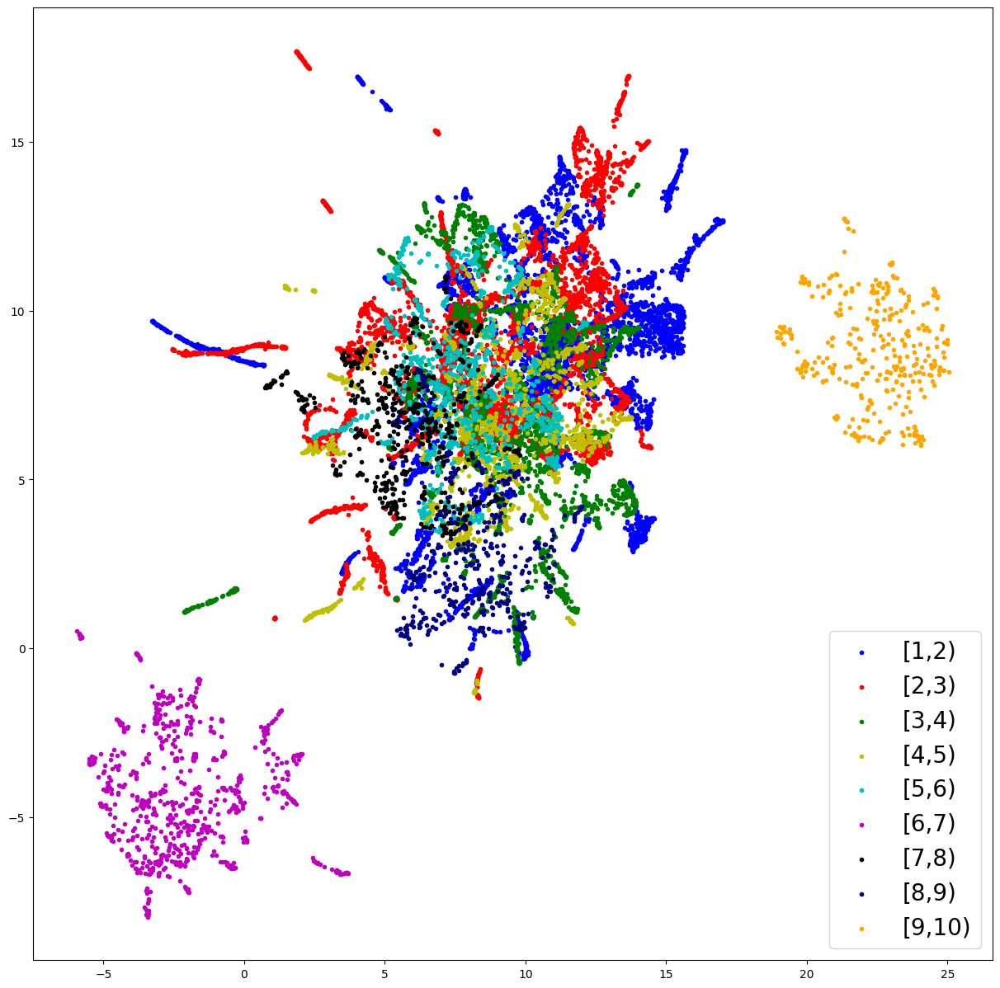

In [ ]:
# Plot the points in scatter plot
plt.figure(figsize=(15, 15))
plt.scatter(Train_whole_2_1_reduced[:, 0], Train_whole_2_1_reduced[:, 1], c='b', label='[1,2)', marker='.')
plt.scatter(Train_whole_2_2_reduced[:, 0], Train_whole_2_2_reduced[:, 1], c='r', label='[2,3)', marker='.')
plt.scatter(Train_whole_2_3_reduced[:, 0], Train_whole_2_3_reduced[:, 1], c='g', label='[3,4)', marker='.')
plt.scatter(Train_whole_2_4_reduced[:, 0], Train_whole_2_4_reduced[:, 1], c='y', label='[4,5)', marker='.')
plt.scatter(Train_whole_2_5_reduced[:, 0], Train_whole_2_5_reduced[:, 1], c='c', label='[5,6)', marker='.')
plt.scatter(Train_whole_2_6_reduced[:, 0], Train_whole_2_6_reduced[:, 1], c='m', label='[6,7)', marker='.')
plt.scatter(Train_whole_2_7_reduced[:, 0], Train_whole_2_7_reduced[:, 1], c='k', label='[7,8)', marker='.')
plt.scatter(Train_whole_2_8_reduced[:, 0], Train_whole_2_8_reduced[:, 1], c='navy', label='[8,9)', marker='.')
plt.scatter(Train_whole_2_9_reduced[:, 0], Train_whole_2_9_reduced[:, 1], c='orange', label='[9,10)', marker='.')
plt.legend(fontsize=20)
plt.show()

## Analysis on T1feature and T2feature

In [16]:
## read data
t1 = pd.read_csv('./T1feature/1-3-2_mean.csv', index_col=[0], header=[0, 1, 2])
t2 = pd.read_csv('./T2feature/1-3-2_mean.csv', index_col=[0], header=[0, 1, 2])
t1

LEVEL2               alanine aminotransferase                                \
Aggregation Function                     mean                                 
hours_in                                   11        13        17        21   
0                                    0.000622  0.000581  0.000485  0.000956   

LEVEL2                                                                  \
Aggregation Function           time_since_measured                       
hours_in                  diff                  11        13        14   
0                     0.000569            0.000659  0.000611  0.000619   

LEVEL2                                    ... white blood cell count  \
Aggregation Function                      ...                   mean   
hours_in                    15        17  ...                     19   
0                     0.000707  0.000435  ...               0.000444   

LEVEL2                                                                 \
Aggregation Function                    time_since_measured             
hours_in                    20       21                   8        10   
0                     0.000656  0.00045            0.000572  0.000493   

LEVEL2               white blood cell count urine                      \
Aggregation Function          time_since_measured                       
hours_in                                        8        19        20   
0                                        0.000811  0.000527  0.001281   

LEVEL2                                    
Aggregation Function                      
hours_in                    22      diff  
0                     0.000462  0.001496  

[1 rows x 794 columns]

In [17]:
t2

LEVEL2                 albumin                                          \
Aggregation Function      mask      mean                                 
hours_in                     7         4         6         7        10   
0                     0.000739  0.000614  0.000964  0.001073  0.001015   

LEVEL2                                             alkaline phosphate  \
Aggregation Function                                             mean   
hours_in                    11        12        13                  1   
0                     0.001003  0.000627  0.000601           0.000578   

LEVEL2                                    ... white blood cell count  \
Aggregation Function time_since_measured  ...    time_since_measured   
hours_in                               1  ...                      7   
0                               0.000626  ...               0.000632   

LEVEL2                                                                  \
Aggregation Function                                                     
hours_in                    11        12        13        15        18   
0                     0.000554  0.000761  0.000676  0.001605  0.000751   

LEVEL2                                   white blood cell count urine  \
Aggregation Function                              time_since_measured   
hours_in                    19        21                           16   
0                     0.000594  0.000623                     0.000598   

LEVEL2                          
Aggregation Function            
hours_in                    17  
0                     0.000551  

[1 rows x 777 columns]

In [18]:
# For each header[0] in t1, calculate how many columns it has
t1_col = []
for i in t1.columns.get_level_values(0).unique():
    t1_col.append(t1[i].shape[1])
len(t1_col)

91

In [19]:
# For each header[0] in t2, calculate how many columns it has
t2_col = []
for i in t2.columns.get_level_values(0).unique():
    t2_col.append(t2[i].shape[1])
len(t2_col)

94

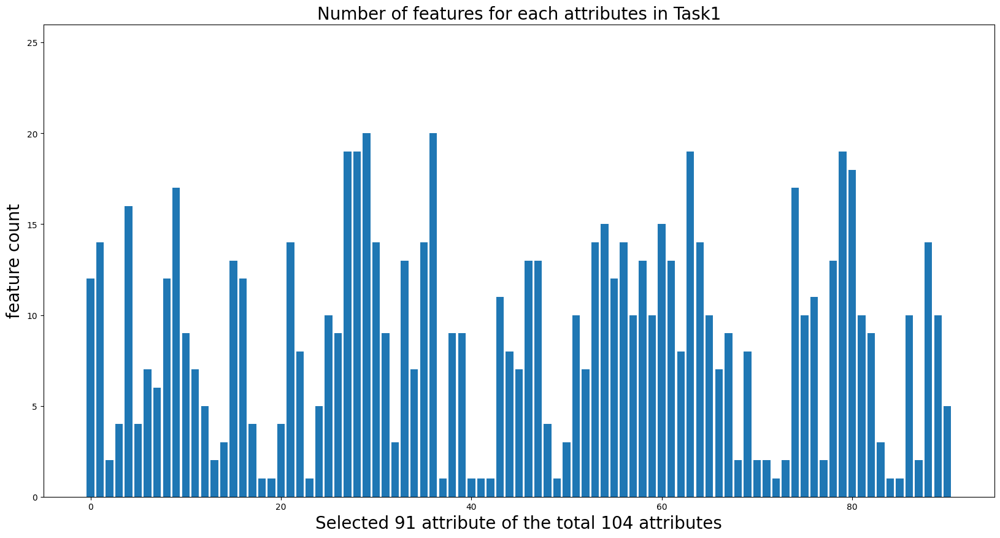

In [24]:
# Draw a table to show the number of columns for each header[0] in t1
plt.figure(figsize=(20, 10))
plt.title('Number of features for each attributes in Task1', fontsize=20)
plt.xlabel('Selected 91 attribute of the total 104 attributes', fontsize=20)
plt.ylabel('feature count', fontsize=20)
plt.bar(np.arange(len(t1_col)), t1_col)
plt.ylim(0, 26)
plt.show()

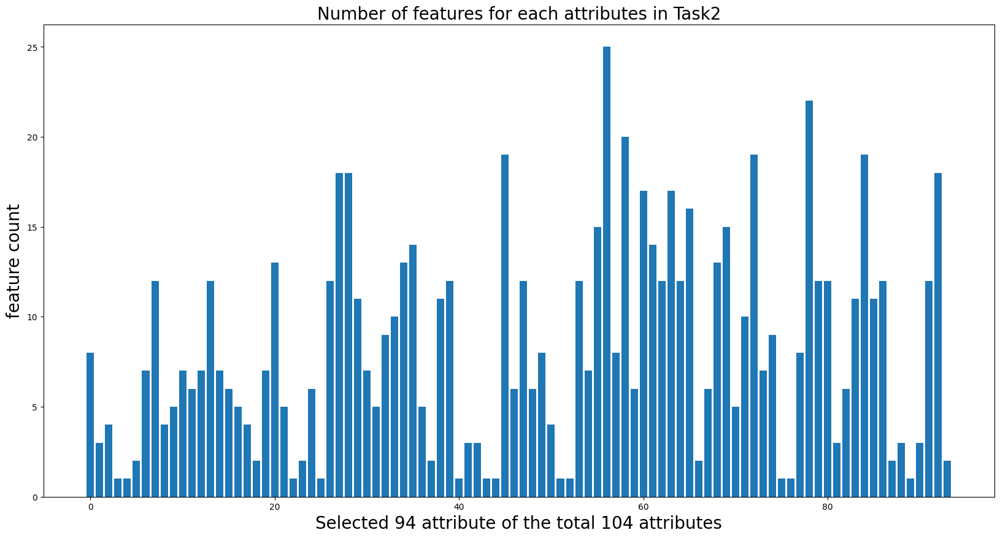

In [20]:
# Draw a table to show the number of columns for each header[0] in t2
plt.figure(figsize=(20, 10))
plt.title('Number of features for each attributes in Task2', fontsize=20)
plt.xlabel('Selected 94 attribute of the total 104 attributes', fontsize=20)
plt.ylabel('feature count', fontsize=20)
plt.bar(np.arange(len(t2_col)), t2_col)
plt.show()